In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import numpy as np
import math
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    RocCurveDisplay
)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc


In [78]:
df = pd.read_csv("E:/ml/ml_github/assign5/Experiment 5_Dataset/Experiment_5 dataset/english.csv")

df

,image,label
0,Img/img001-001.png,0
1,Img/img001-002.png,0
2,Img/img001-003.png,0
3,Img/img001-004.png,0
4,Img/img001-005.png,0
...,...,...
3405,Img/img062-051.png,z
3406,Img/img062-052.png,z
3407,Img/img062-053.png,z
3408,Img/img062-054.png,z


In [79]:
image_folder  = "E:/ml/ml_github/assign5/Experiment 5_Dataset/Experiment_5 dataset/Img/"
base_path = "E:/ml/ml_github/assign5/Experiment 5_Dataset/Experiment_5 dataset/"

In [80]:
df.columns = df.columns.str.strip()

print(df.describe())
print(df.info())

print(df.isnull().sum())



                     image label
count                 3410  3410
unique                3410    62
top     Img/img062-055.png     0
freq                     1    55
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3410 entries, 0 to 3409
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   3410 non-null   object
 1   label   3410 non-null   object
dtypes: object(2)
memory usage: 53.4+ KB
None
image    0
label    0
dtype: int64


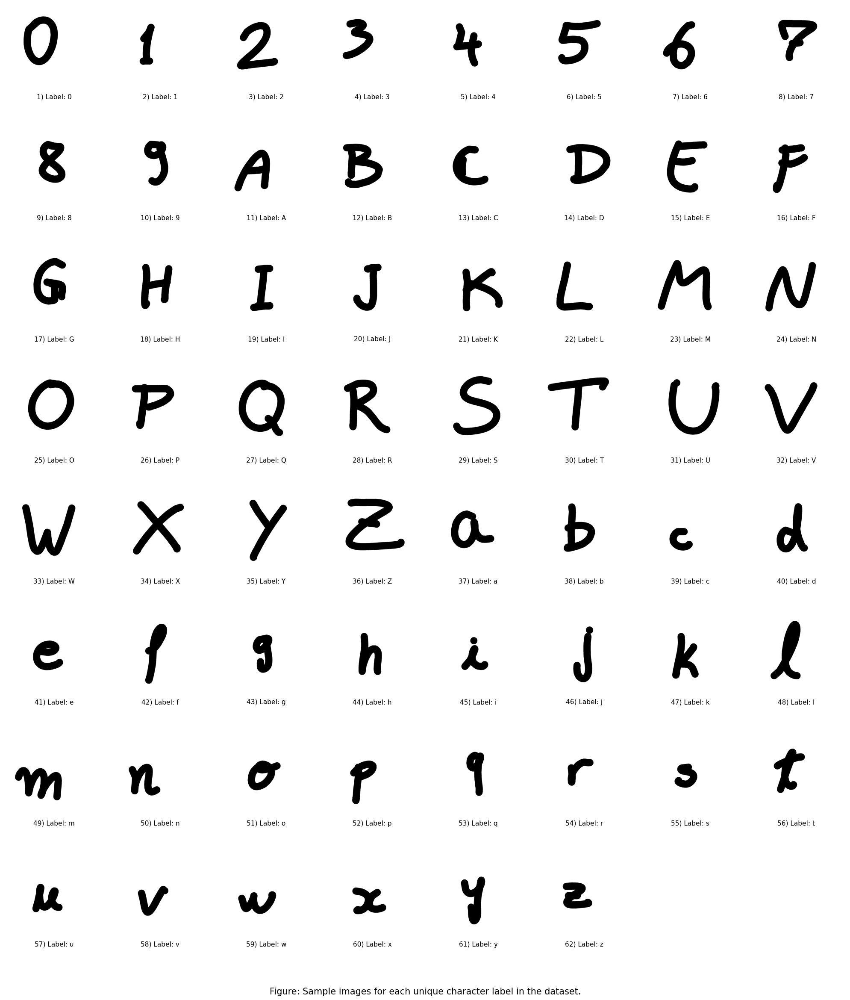

In [81]:


samples = df.groupby('label').first().reset_index()
num_labels = len(samples)
cols_per_row = 8 
rows_needed = math.ceil(num_labels / cols_per_row)

fig, axes = plt.subplots(rows_needed, cols_per_row, figsize=(20, 3 * rows_needed))
axes = axes.flatten()

subplot_labels = [f"{i+1})" for i in range(num_labels)]

for i, (idx, row) in enumerate(samples.iterrows()):
    ax = axes[i]
    img_relative_path = row['image']
    img_full_path = os.path.join(base_path, img_relative_path)
    
    if os.path.exists(img_full_path):
        image = cv2.imread(img_full_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax.imshow(image_rgb)
    else:
        ax.text(0.5, 0.5, "File Not Found", ha='center', va='center')
        
    ax.set_title("")
    ax.axis('off')

    ax.text(0.5, -0.20, f"{subplot_labels[i]} Label: {row['label']}", 
            ha="center", va="top", transform=ax.transAxes, fontsize=11)

    for spine in ax.spines.values():
        spine.set_visible(True)
       

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.text(0.5, 0.01, "Figure: Sample images for each unique character label in the dataset.", 
         ha="center", fontsize=15)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.show()

In [82]:
images = []

for img_relative_path in df['image']:
    img_full_path = os.path.join(base_path,img_relative_path)

    if os.path.exists(img_full_path):
        img = cv2.imread(img_full_path,0) # 0 -> greyscale
        img = cv2.resize(img,(28,28))
        images.append(img)

print(images)

print("Newww")
images = np.array(images)  # Default list , array helps reshape

print(images)
print("Images shape : ",images.shape)



[array([[255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255,   0,   0,   0,   0,
        255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
        255, 255],
       [2

In [83]:

print("Minimum pixel value : ", images.min())

print("Maximum pixel value : ",images.max())


Minimum pixel value :  0
Maximum pixel value :  255


In [84]:
images = images /255.0

print("After normalization")
print("Min:", images.min())
print("Max:", images.max())

After normalization
Min: 0.0
Max: 1.0


In [85]:
images_flat = images.reshape(images.shape[0],-1)


In [86]:
x = images_flat
y = df['label'].values
y_binary = np.where(y == '0', 1, 0)
print(y_binary.shape)

(3410,)


In [87]:
n_samples, n_features = x.shape

w = np.zeros(n_features)
b = 0.1
lr = 0.01
epochs = 100

In [88]:
print(x.shape)
print(y_binary.shape)

(3410, 784)
(3410,)


In [89]:
print(x[0])
print(y[0])

[1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         

In [90]:
x_temp, x_test, y_temp, y_test = train_test_split(
    x, y, test_size=0.2, random_state=42
)

x_train, x_val, y_train, y_val = train_test_split(
    x_temp, y_temp, test_size=0.25, random_state=42
)
y_train_binary = np.where(y_train == '0', 1, 0)
y_test_binary = np.where(y_test == '0', 1, 0)

print(y_train_binary.shape)
print(y_test_binary.shape)


(2046,)
(682,)


In [91]:
losses = []

for epoch in range(epochs):
    errors = 0
    
    for i in range(len(x_train)):
        linear_output = np.dot(x_train[i], w) + b

        y_pred = 1 if linear_output >= 0 else 0

        update = lr * (y_train_binary[i] - y_pred)

        if update != 0:
            errors += 1

        w = w + update * x_train[i]
        b = b + update
    
    losses.append(errors)   

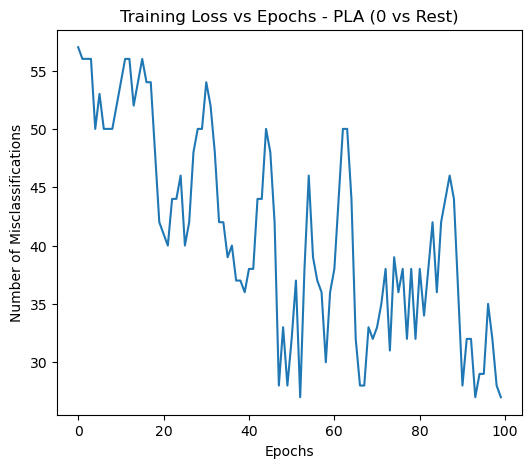

In [142]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,5))
plt.plot(losses)
plt.xlabel("Epochs")
plt.ylabel("Number of Misclassifications")
plt.title("Training Loss vs Epochs - PLA (0 vs Rest)")
plt.show()

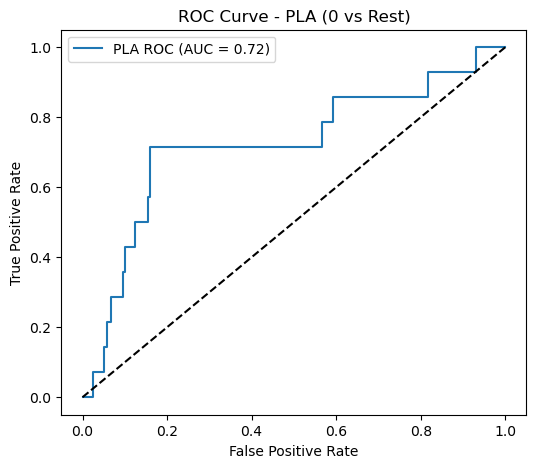

In [141]:
y_score = np.dot(x_test, w) + b
fpr, tpr, thresholds = roc_curve(y_test_binary, y_score)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f"PLA ROC (AUC = {roc_auc:.2f})")
plt.plot([0,1],[0,1],'k--')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - PLA (0 vs Rest)")
plt.legend()
plt.show()

In [94]:
def predict(x):
    linear_output = np.dot(x, w) + b
    return np.where(linear_output >= 0, 1, 0)

predictions = predict(x_test)

Accuracy: 0.9794721407624634
Precision: 0.0
Recall: 0.0
F1-score: 0.0

Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       668
           1       0.00      0.00      0.00        14

    accuracy                           0.98       682
   macro avg       0.49      0.50      0.49       682
weighted avg       0.96      0.98      0.97       682



e:\anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
e:\anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
e:\anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
e:\anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: 

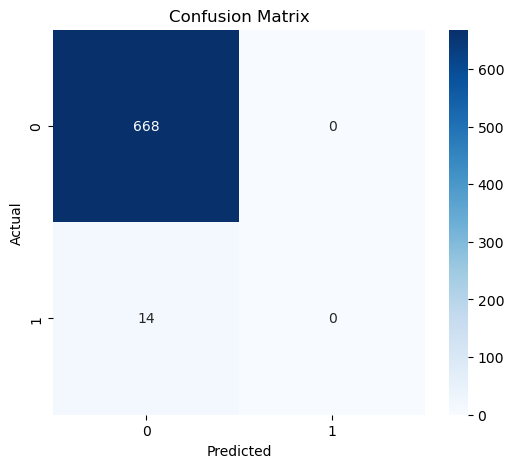

In [115]:
acc = accuracy_score(y_test_binary, predictions)
print("Accuracy:", acc)
print("Precision:", precision_score(predictions, y_test_binary))
print("Recall:", recall_score(predictions, y_test_binary))
print("F1-score:", f1_score(predictions, y_test_binary))
print("\nClassification Report:")
print(classification_report(y_test_binary, predictions))

cm = confusion_matrix(y_test_binary, predictions)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title(f"Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

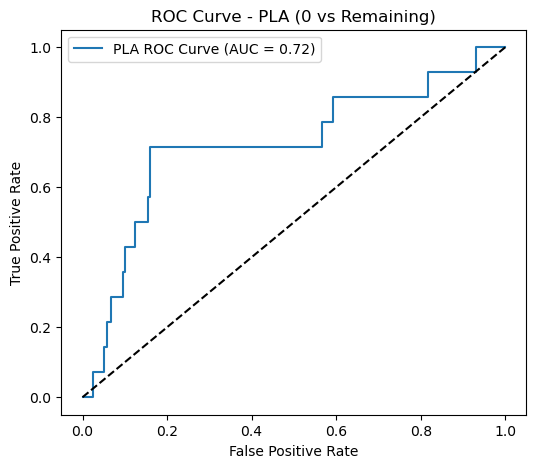

In [140]:
y_score = np.dot(x_test, w) + b
fpr, tpr, thresholds = roc_curve(y_test_binary, y_score)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f"PLA ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - PLA (0 vs Remaining)")
plt.legend()
plt.savefig(fname= "ROC_CURVE_PLA.png",dpi = 300,format= "png",bbox_inches = "tight")
plt.show()

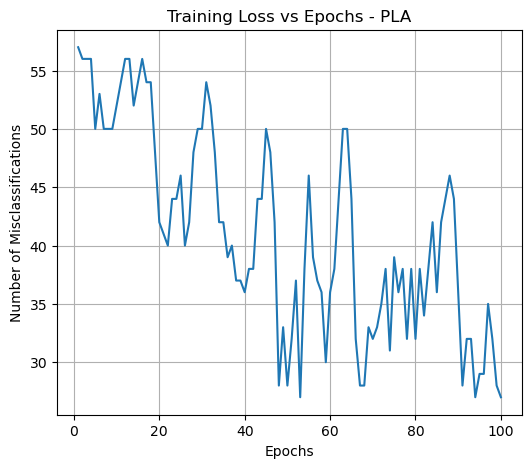

In [134]:
plt.figure(figsize=(6,5))
plt.plot(range(1, len(losses)+1), losses)

plt.xlabel("Epochs")
plt.ylabel("Number of Misclassifications")
plt.title("Training Loss vs Epochs - PLA")
plt.grid(True)

plt.savefig("loss_pla.png", dpi=300, bbox_inches="tight")
plt.show()

In [97]:
from sklearn.neural_network import MLPClassifier

model_1 = MLPClassifier(
    hidden_layer_sizes=(128,),
    activation='relu',
    solver='sgd',
    learning_rate_init=0.01,
    batch_size=32,
    max_iter=300,
    random_state=42
)

model_1.fit(x_train, y_train)


print("Experiment 1")

y_test_pred = model_1.predict(x_test)

print("Test Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1-score:", f1_score(y_test, y_test_pred, average='weighted'))


Experiment 1
Test Accuracy: 0.011730205278592375
Precision: 0.00013759771587791643
Recall: 0.011730205278592375
F1-score: 0.0002720047600833015


e:\anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


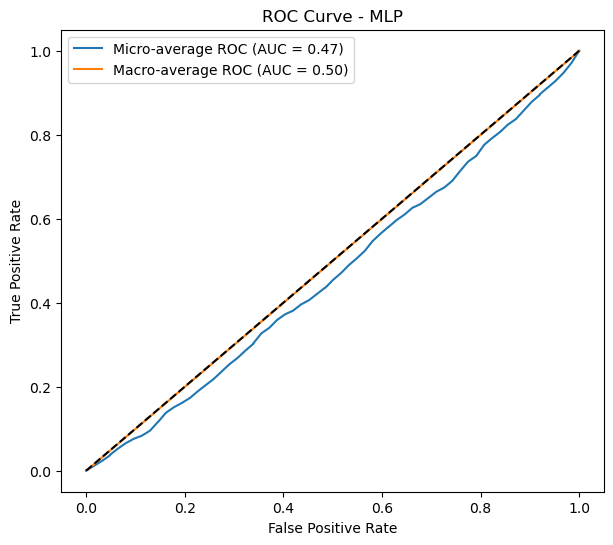

In [143]:

from sklearn.preprocessing import label_binarize
classes = np.unique(y_test)

y_test_bin = label_binarize(y_test, classes=classes)
y_score = model_1.predict_proba(x_test)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(
    y_test_bin.ravel(),
    y_score.ravel()
)
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)

for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= len(classes)

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

plt.figure(figsize=(7,6))
plt.plot(fpr["micro"], tpr["micro"],
         label=f"Micro-average ROC (AUC = {roc_auc['micro']:.2f})")

plt.plot(fpr["macro"], tpr["macro"],
         label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

plt.plot([0,1],[0,1],'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP")
plt.legend()
plt.savefig(
    fname = "ROC CURVE - MLP(128).png",
    format="png", dpi = 300, bbox_inches= "tight"
)
plt.show()

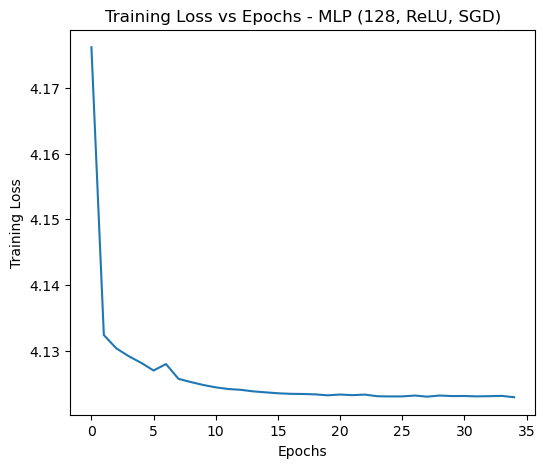

In [144]:
plt.figure(figsize=(6,5))
plt.plot(model_1.loss_curve_)
plt.xlabel("Epochs")
plt.ylabel("Training Loss")
plt.title("Training Loss vs Epochs - MLP (128, ReLU, SGD)")
plt.savefig(
    fname = "Training Loss vs Epochs - MLP(128).png",
    format="png", dpi = 300, bbox_inches= "tight"
)
plt.show()

In [100]:
model_2 = MLPClassifier(
    hidden_layer_sizes=(256,128),
    activation='relu',
    solver='adam',
    learning_rate_init=0.001,
    batch_size=64,
    max_iter=300,
    random_state=42
)

model_2.fit(x_train, y_train)
print("Experiment 1")

y_test_pred = model_2.predict(x_test)

print("Test Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1-score:", f1_score(y_test, y_test_pred, average='weighted'))


Experiment 1
Test Accuracy: 0.36363636363636365
Precision: 0.38526654578280795
Recall: 0.36363636363636365
F1-score: 0.35583193895974113


e:\anaconda\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


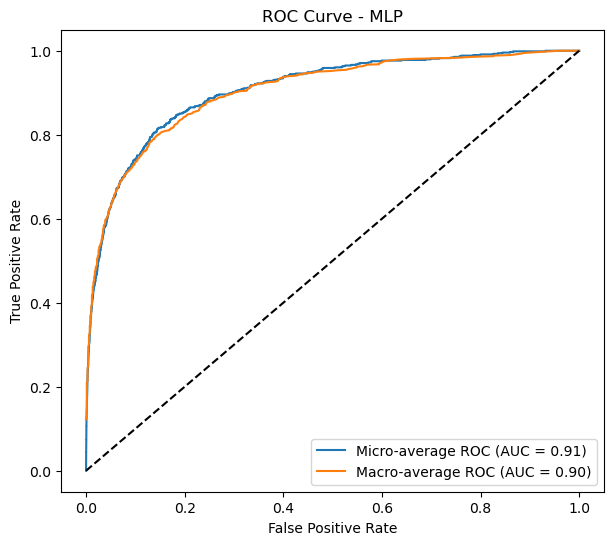

In [145]:

from sklearn.preprocessing import label_binarize
classes = np.unique(y_test)

y_test_bin = label_binarize(y_test, classes=classes)
y_score = model_2.predict_proba(x_test)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(
    y_test_bin.ravel(),
    y_score.ravel()
)
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)

for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= len(classes)

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

plt.figure(figsize=(7,6))
plt.plot(fpr["micro"], tpr["micro"],
         label=f"Micro-average ROC (AUC = {roc_auc['micro']:.2f})")

plt.plot(fpr["macro"], tpr["macro"],
         label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

plt.plot([0,1],[0,1],'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP")
plt.legend()
plt.savefig(
    fname = "ROC_CURVE - MLP(256-128).png",
    format="png", dpi = 300, bbox_inches= "tight"
)
plt.show()

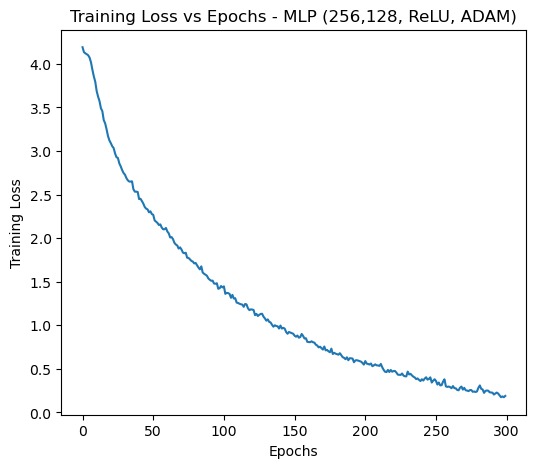

<Figure size 640x480 with 0 Axes>

In [146]:
plt.figure(figsize=(6,5))
plt.plot(model_2.loss_curve_)
plt.xlabel("Epochs")
plt.ylabel("Training Loss")
plt.title("Training Loss vs Epochs - MLP (256,128, ReLU, ADAM)")
plt.show()
plt.savefig(
    fname = "Training Loss vs Epochs - MLP(256-128).png",
    format="png", dpi = 300, bbox_inches= "tight"
)

In [103]:
model_3 = MLPClassifier(
    hidden_layer_sizes=(512,256,128),
    activation='tanh',
    solver='adam',
    learning_rate_init=0.0005,
    batch_size=64,
    max_iter=400,
    random_state=42
)

model_3.fit(x_train, y_train)
print("Experiment 1")

y_test_pred = model_3.predict(x_test)

print("Test Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1-score:", f1_score(y_test, y_test_pred, average='weighted'))

Experiment 1
Test Accuracy: 0.23900293255131966
Precision: 0.3311062714021943
Recall: 0.23900293255131966
F1-score: 0.21649078519080908


e:\anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


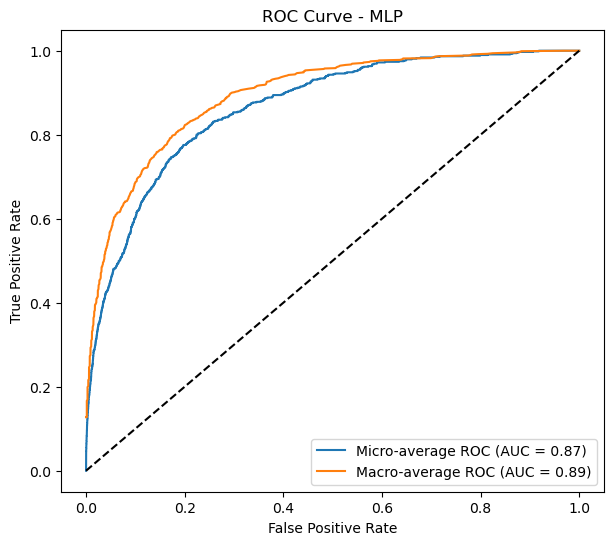

<Figure size 640x480 with 0 Axes>

In [147]:

from sklearn.preprocessing import label_binarize
classes = np.unique(y_test)

y_test_bin = label_binarize(y_test, classes=classes)
y_score = model_3.predict_proba(x_test)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(
    y_test_bin.ravel(),
    y_score.ravel()
)
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
mean_tpr = np.zeros_like(all_fpr)

for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= len(classes)

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

plt.figure(figsize=(7,6))
plt.plot(fpr["micro"], tpr["micro"],
         label=f"Micro-average ROC (AUC = {roc_auc['micro']:.2f})")

plt.plot(fpr["macro"], tpr["macro"],
         label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

plt.plot([0,1],[0,1],'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP")
plt.legend()
plt.show()
plt.savefig(
    fname = "ROC_CURVE - MLP(512-256-128).png",
    format="png", dpi = 300, bbox_inches= "tight"
)

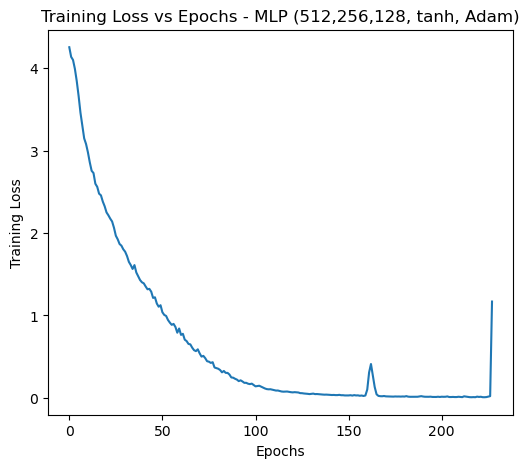

<Figure size 640x480 with 0 Axes>

In [148]:
plt.figure(figsize=(6,5))
plt.plot(model_3.loss_curve_)
plt.xlabel("Epochs")
plt.ylabel("Training Loss")
plt.title("Training Loss vs Epochs - MLP (512,256,128, tanh, Adam)")
plt.show()
plt.savefig(
    fname = "Training Loss vs Epochs - MLP(512-256-128).png",
    format="png", dpi = 300, bbox_inches= "tight"
)

In [106]:
param_grid = {
    'activation': ['relu', 'tanh', 'logistic'],   # logistic = sigmoid
    'solver': ['sgd', 'adam'],
    'learning_rate_init': [0.01, 0.001],
    'batch_size': [32, 64]
}

In [107]:


param_grid_1 = {
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd']
}

grid_1 = GridSearchCV(
    estimator=model_1,
    param_grid=param_grid_1,
    cv=3,
    n_jobs=-1
)

grid_1.fit(x_train, y_train)

print("Best Params (Stage 1):", grid_1.best_params_)

best_activation = grid_1.best_params_['activation']
best_solver = grid_1.best_params_['solver']

model_stage2 = MLPClassifier(
    activation=best_activation,
    solver=best_solver,
    max_iter=200,
    random_state=42
)

param_grid_2 = {
    'learning_rate_init': [0.001, 0.01],
    'batch_size': [16, 32]
}

grid_2 = GridSearchCV(
    estimator=model_stage2,
    param_grid=param_grid_2,
    cv=3,
    n_jobs=-1
)

grid_2.fit(x_train, y_train)

print("Best Params (Stage 2):", grid_2.best_params_)

e:\anaconda\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Best Params (Stage 1): {'activation': 'tanh', 'solver': 'sgd'}
Best Params (Stage 2): {'batch_size': 32, 'learning_rate_init': 0.001}


e:\anaconda\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [108]:


param_grid_1 = {
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd']
}

grid_1 = GridSearchCV(
    estimator=model_2,
    param_grid=param_grid_1,
    cv=3,
    n_jobs=-1
)

grid_1.fit(x_train, y_train)

print("Best Params (Stage 1):", grid_1.best_params_)

best_activation = grid_1.best_params_['activation']
best_solver = grid_1.best_params_['solver']

model_stage2 = MLPClassifier(
    activation=best_activation,
    solver=best_solver,
    max_iter=200,
    random_state=42
)

param_grid_2 = {
    'learning_rate_init': [0.001, 0.01],
    'batch_size': [16, 32]
}

grid_2 = GridSearchCV(
    estimator=model_stage2,
    param_grid=param_grid_2,
    cv=3,
    n_jobs=-1
)

grid_2.fit(x_train, y_train)

print("Best Params (Stage 2):", grid_2.best_params_)

Best Params (Stage 1): {'activation': 'tanh', 'solver': 'adam'}
Best Params (Stage 2): {'batch_size': 32, 'learning_rate_init': 0.001}


e:\anaconda\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [109]:


param_grid_1 = {
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd']
}

grid_1 = GridSearchCV(
    estimator=model_3,
    param_grid=param_grid_1,
    cv=3,
    n_jobs=-1
)

grid_1.fit(x_train, y_train)

print("Best Params (Stage 1):", grid_1.best_params_)

best_activation = grid_1.best_params_['activation']
best_solver = grid_1.best_params_['solver']

model_stage2 = MLPClassifier(
    activation=best_activation,
    solver=best_solver,
    max_iter=200,
    random_state=42
)

param_grid_2 = {
    'learning_rate_init': [0.001, 0.01],
    'batch_size': [16, 32]
}

grid_2 = GridSearchCV(
    estimator=model_stage2,
    param_grid=param_grid_2,
    cv=3,
    n_jobs=-1
)

grid_2.fit(x_train, y_train)

print("Best Params (Stage 2):", grid_2.best_params_)

Best Params (Stage 1): {'activation': 'tanh', 'solver': 'adam'}
Best Params (Stage 2): {'batch_size': 32, 'learning_rate_init': 0.001}


e:\anaconda\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
print("PLA model")
print("Epochs Run:", len(losses))
print("Final Training Loss:", losses[-1])

PLA model
Epochs Run: 100
Final Training Loss (Misclassifications): 27


In [111]:
print("MLP model_1")
print("Epochs Run:", model_1.n_iter_)
print("Final Training Loss:", model_1.loss_)

MLP model_1
Epochs Run: 35
Final Training Loss: 4.122986308840179


In [112]:
print("MLP model_2")
print("Epochs Run:", model_2.n_iter_)
print("Final Training Loss:", model_2.loss_)

MLP model_2
Epochs Run: 300
Final Training Loss: 0.18976164587637573


In [113]:
print("MLP model_3")
print("Epochs Run:", model_3.n_iter_)
print("Final Training Loss:", model_3.loss_)

MLP model_3
Epochs Run: 228
Final Training Loss: 1.1689374362805243


In [116]:
model_tuned = MLPClassifier(
    hidden_layer_sizes=(256,128),
    activation='tanh',
    solver='adam',
    learning_rate_init=0.001,
    batch_size=32,
    max_iter=400,
    random_state=42
)

model_tuned.fit(x_train, y_train)
print("Experiment 1")

y_test_pred = model_tuned.predict(x_test)

print("Test Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1-score:", f1_score(y_test, y_test_pred, average='weighted'))

Experiment 1
Test Accuracy: 0.2697947214076246
Precision: 0.28957764787442386
Recall: 0.2697947214076246
F1-score: 0.2642635458893207
